In [1]:
import numpy as np
import pandas as pd
from glob import glob
import datetime
from pyproj import Transformer
import matplotlib.pyplot as plt
import wradlib as wrl
import re


In [2]:
remove_cycle = lambda x,c : (x[c] + (np.cumsum(x[c:].values - x[:-c]))/c).shift(c)

In [20]:
cycle_length = 24

In [4]:
# df_inputs = pd.read_pickle('2020_input_data')
# df_inputs = df_inputs.iloc[:,[0,-1]]

df_inputs = pd.read_pickle('./2020_input_data_four_areas')
df_inputs = df_inputs.iloc[:,[0,-1,-2,-3,-4]]

df_target = pd.read_pickle('../Drainage data/drainage_ANA_target')

df_target = remove_cycle(df_target,cycle_length)

inputs = df_inputs.dropna()
target = df_target.dropna()


df_target_2 = pd.read_pickle('../Drainage data/drainage_ING_target')
df_target_2 = remove_cycle(df_target_2,cycle_length)
target_2 = df_target_2.dropna().iloc[1800:]

# common_index = inputs.index.intersection(target.index)
common_index = inputs.index.intersection(target.index).intersection(target_2.index)
inputs = inputs.loc[common_index].resample('1h').interpolate(method='linear')
target = target.loc[common_index].resample('1h').interpolate(method='linear')
target_2 = target_2.loc[common_index].resample('1h').interpolate(method='linear')

inputs = inputs.values
target = target.values
target_2 = target_2.values

target = np.c_[target,target_2]

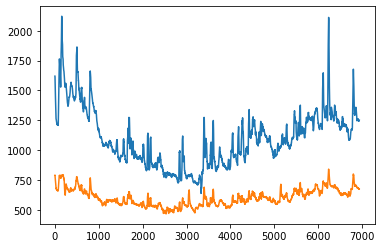

In [5]:
plt.plot(target)

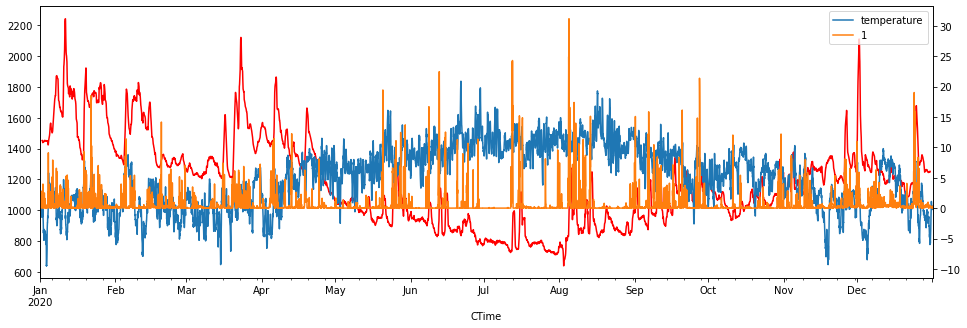

(439888.0, 440688.0)

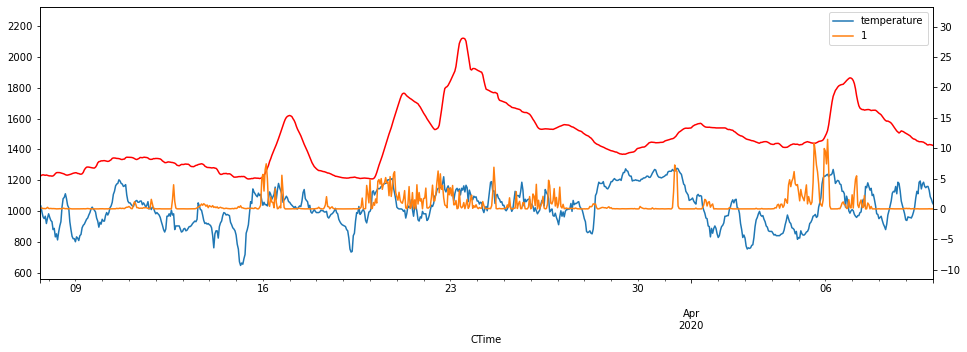

In [6]:
plt.figure(figsize=(16,5))
df_target.plot(color='red')
df_inputs.iloc[:,[0,-1]].plot(ax = plt.twinx())
plt.legend()
plt.show()


plt.figure(figsize=(16,5))
df_target.plot(color='red')
df_inputs.iloc[:,[0,-1]].plot(ax = plt.twinx())
plt.legend()
plt.xlim(df_inputs.index[1600],df_inputs.index[2400])

In [7]:
# x_tmp = range(-100,100)
# y_tmp = [np.corrcoef(np.roll(inputs[:,-1].ravel(),i),target.ravel())[0,1] for i in x_tmp]
# plt.plot(x_tmp,y_tmp)

In [21]:

import torch
import torch.nn as nn
from torch.optim import lr_scheduler as lrs
torch.set_default_dtype(torch.float32)

class Model(nn.Module):
    def __init__(self):
        """Initialize Wrapper for LSTM
        """
        super(Model, self).__init__()
        n_hidden = 1
        n_out = 2
        n_in = 5
        self.rnn = nn.LSTM(input_size=n_in, hidden_size=n_hidden)
        # self.fc = nn.Linear(n_hidden, 1)
        self.fc = nn.Linear(3, n_out)
        self.fc1 = nn.Linear(n_hidden, 1)
        self.fc2 = nn.Linear(n_hidden, 1)
        self.fc3 = nn.Linear(n_hidden, 1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Perform forward pass.
        :param x: Tensor with dynamic input features.
        :return: Tensor containing the model predictions.
        """
        # make prediction from last time step
        rnn_output, (hn, cn) = self.rnn(x)
        # print(rnn_output.shape, hn.shape, cn.shape)
        output1 = self.fc1(cn)
        output2 = self.fc2(hn)
        output3 = self.fc3(rnn_output[[-1]])
        output_tmp = torch.cat((output1,output2,output3), dim=2)
        output = self.fc(output_tmp)
        return output, hn, cn
    
    

In [22]:
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(DEVICE)
model = Model().to(DEVICE)
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
optimizer = torch.optim.Adam(model.parameters(), lr=5e-3)
# lr_scheduler = lrs.MultiStepLR(optimizer, milestones=[10, 20, 30, 40, 50], gamma=0.1)
loss_func = torch.nn.MSELoss()
# loss_func = torch.nn.L1Loss()

cuda:0


In [23]:
# output_sequences.shape

In [24]:
from torch.utils.data import DataLoader,TensorDataset
# from torch.utils.data. import 
val_ratio = 0.5
sequence_size = 2*7*24 # 4 weeks in hours
batch_size = 32

n_train = int(len(inputs)*(1-val_ratio))
n_input_variables = inputs.shape[1]

input_sequences = np.lib.stride_tricks.sliding_window_view(inputs,(sequence_size,n_input_variables)).squeeze()
output_sequences = np.lib.stride_tricks.sliding_window_view(target,(sequence_size,2)).squeeze()

output_sequences = output_sequences-np.mean(output_sequences,axis = (0,1))

input_sequences = torch.from_numpy(np.array(input_sequences,dtype='float32')).to(DEVICE)
output_sequences = torch.from_numpy(np.array(output_sequences,dtype='float32')).to(DEVICE)


X_train = input_sequences[:n_train]
y_train = output_sequences[:n_train,-1]
X_val = input_sequences[n_train:]
y_val = output_sequences[n_train:,-1]

training_dataset = TensorDataset(X_train,y_train)
validation_dataset = TensorDataset(X_val,y_val)

training_data_loader = DataLoader(training_dataset, batch_size=batch_size)
validation_data_loader = DataLoader(validation_dataset, batch_size=len(input_sequences) - n_train)

# Check that dtypes match
# tmp_input = [i[0] for i in training_dataset]
# tmp_input = tmp_input.permute((1,0,2)).to(DEVICE)
# assert tmp_input.dtype == optimizer.param_groups[0]['params'][0][0].dtype
# output = model.forward(tmp_input)

In [25]:
# model(X_val)[0].shape,y_val.shape,len(input_sequences),len(output_sequences),n_train

Epoch 1 - Training loss 32826.67911354555 - Test loss 17584.02734375
Epoch 2 - Training loss 32754.611001810896 - Test loss 17657.26953125
Epoch 3 - Training loss 32666.399830669438 - Test loss 17733.259765625
Epoch 4 - Training loss 32528.353065420728 - Test loss 17779.875
Epoch 5 - Training loss 32272.90543750448 - Test loss 17574.939453125


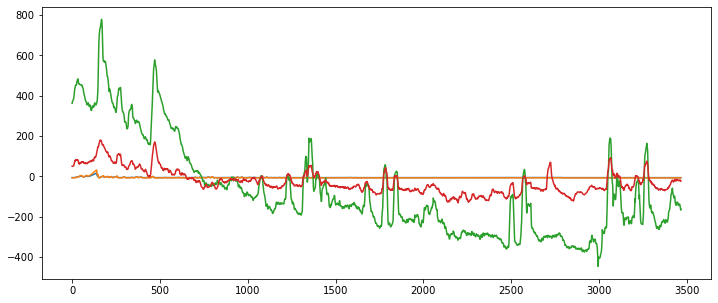

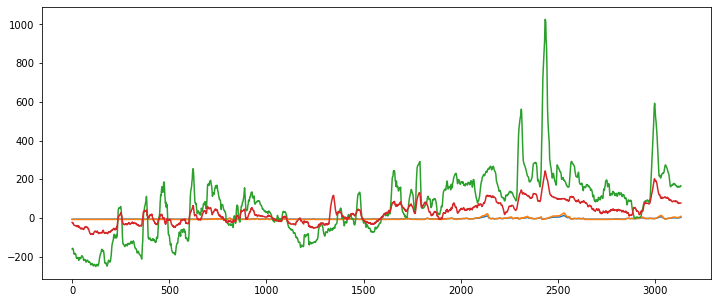

Epoch 6 - Training loss 31837.86177468956 - Test loss 16723.533203125
Epoch 7 - Training loss 31130.171085462658 - Test loss 14944.8955078125
Epoch 8 - Training loss 30187.84703917897 - Test loss 12753.734375
Epoch 9 - Training loss 28998.908509980647 - Test loss 10770.630859375
Epoch 10 - Training loss 27290.034903150085 - Test loss 10875.841796875


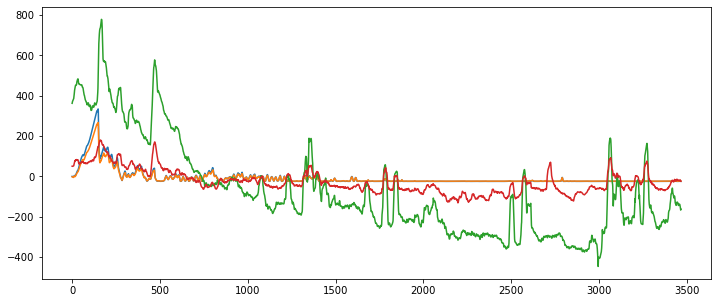

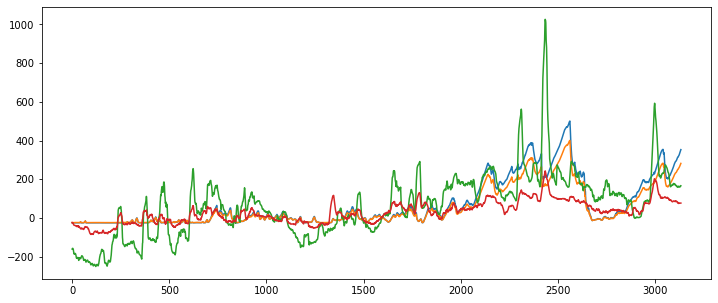

Epoch 11 - Training loss 25678.63829222513 - Test loss 16380.1904296875
Epoch 12 - Training loss 23885.34778895947 - Test loss 24094.94921875
Epoch 13 - Training loss 22590.814505760824 - Test loss 32905.5625
Epoch 14 - Training loss 21411.53628932008 - Test loss 39985.765625
Epoch 15 - Training loss 20416.091009857457 - Test loss 45624.44140625


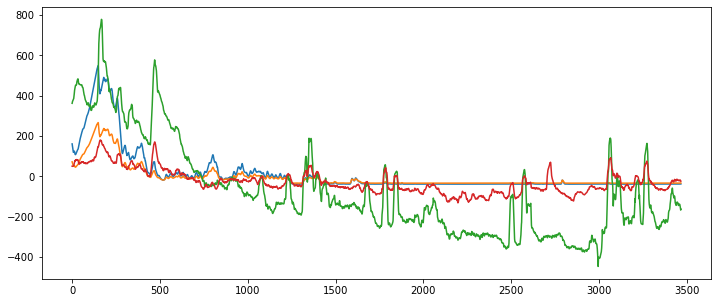

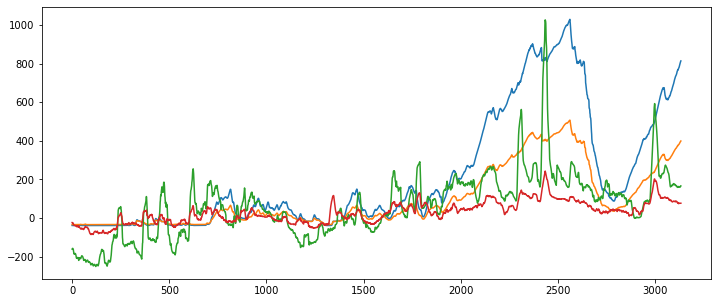

Epoch 16 - Training loss 19511.88731678254 - Test loss 49763.56640625
Epoch 17 - Training loss 18681.381520122563 - Test loss 51270.16015625
Epoch 18 - Training loss 17959.686521197676 - Test loss 52723.53125
Epoch 19 - Training loss 17285.953228311802 - Test loss 51019.24609375
Epoch 20 - Training loss 16594.483220931586 - Test loss 53611.7890625


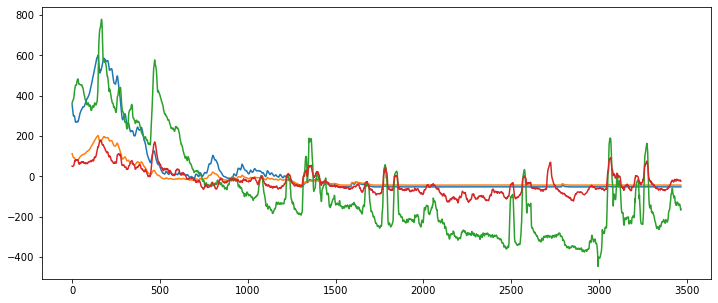

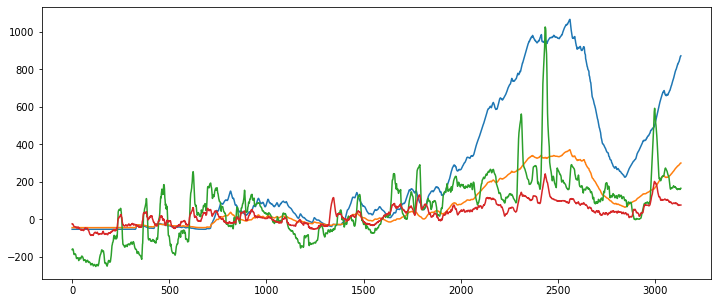

Epoch 21 - Training loss 16246.423680576709 - Test loss 53136.17578125
Epoch 22 - Training loss 15955.573823981329 - Test loss 51722.73828125
Epoch 23 - Training loss 15671.836415422073 - Test loss 50397.3984375
Epoch 24 - Training loss 15389.470204064606 - Test loss 48842.98828125
Epoch 25 - Training loss 15113.578020988254 - Test loss 47243.44140625


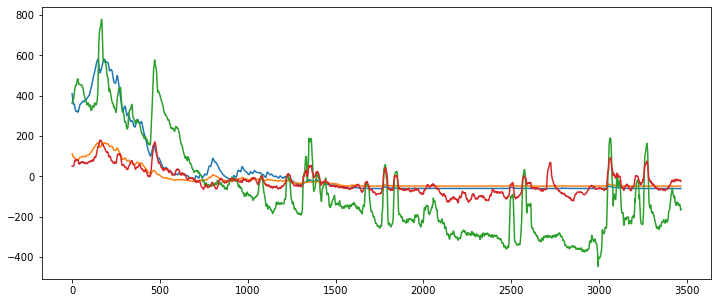

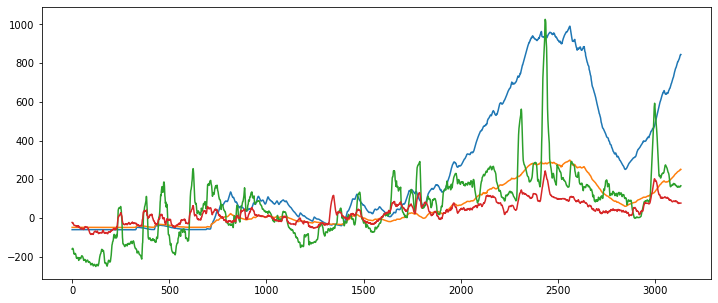

Epoch 26 - Training loss 14840.760922913158 - Test loss 45658.078125
Epoch 27 - Training loss 14573.486002370852 - Test loss 44136.765625
Epoch 28 - Training loss 14313.381196748225 - Test loss 42603.3046875
Epoch 29 - Training loss 14060.7803225736 - Test loss 41268.4296875
Epoch 30 - Training loss 13769.263403516297 - Test loss 40882.55078125


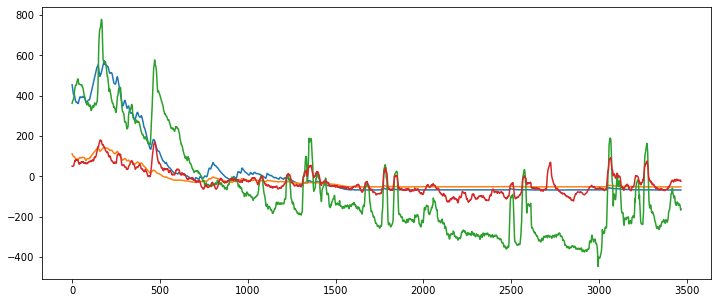

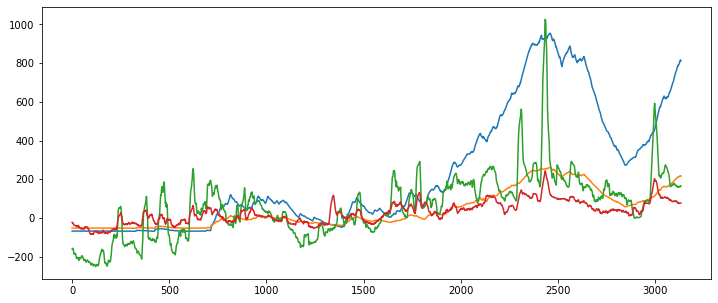

Epoch 31 - Training loss 13648.205298187535 - Test loss 40365.21484375
Epoch 32 - Training loss 13528.636170973472 - Test loss 39783.20703125
Epoch 33 - Training loss 13414.819511693551 - Test loss 39175.109375
Epoch 34 - Training loss 13306.180867886325 - Test loss 38643.5234375
Epoch 35 - Training loss 13166.101401932743 - Test loss 38533.19140625


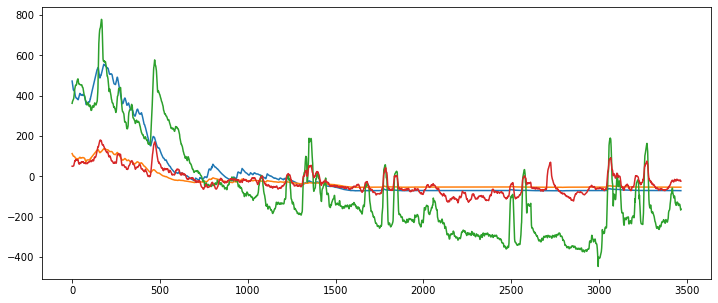

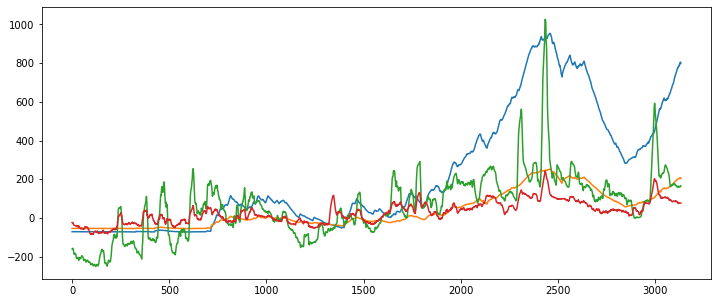

Epoch 36 - Training loss 13145.515258369096 - Test loss 38494.484375
Epoch 37 - Training loss 13122.620545413516 - Test loss 38375.6015625
Epoch 38 - Training loss 13104.205620861929 - Test loss 38262.5234375
Epoch 39 - Training loss 13082.832754572597 - Test loss 38201.12890625
Epoch 40 - Training loss 13062.690223903832 - Test loss 38123.91015625


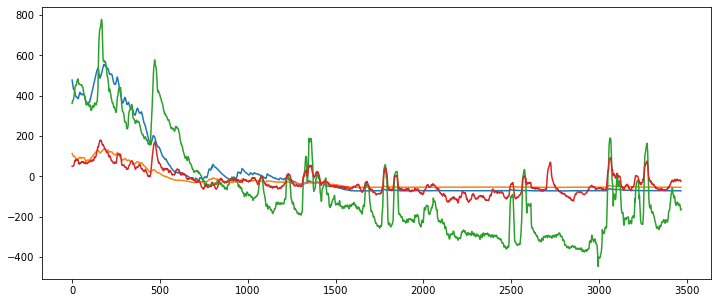

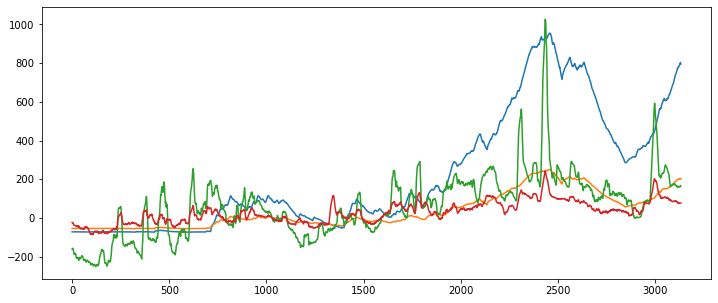

Epoch 41 - Training loss 13044.552303489196 - Test loss 37985.640625
Epoch 42 - Training loss 13022.663062699345 - Test loss 37935.09765625
Epoch 43 - Training loss 13004.383581738954 - Test loss 37822.7734375
Epoch 44 - Training loss 12984.346125891449 - Test loss 37684.796875
Epoch 45 - Training loss 12963.411967146287 - Test loss 37613.78125


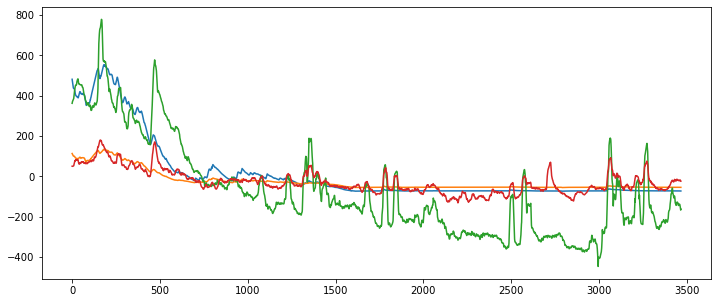

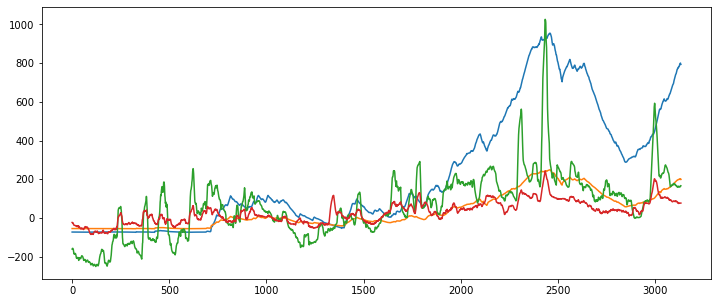

Epoch 46 - Training loss 12945.333689558396 - Test loss 37503.03125
Epoch 47 - Training loss 12923.734423996111 - Test loss 37355.2734375
Epoch 48 - Training loss 12903.963350068538 - Test loss 37311.1875
Epoch 49 - Training loss 12884.283034998343 - Test loss 37173.71484375
Epoch 50 - Training loss 12864.955352503226 - Test loss 37045.359375


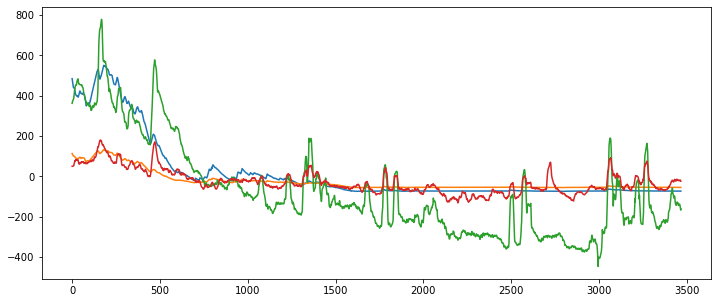

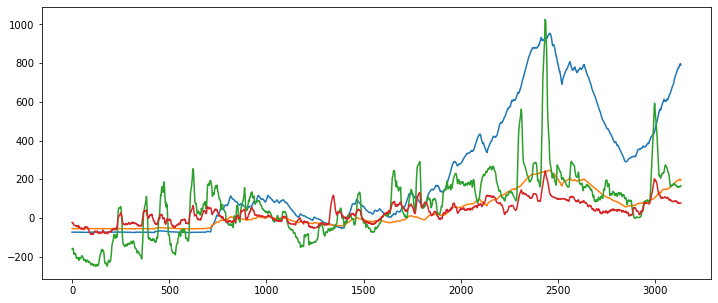

Epoch 51 - Training loss 12844.160737203896 - Test loss 36974.40625
Epoch 52 - Training loss 12825.627855913355 - Test loss 36851.5390625
Epoch 53 - Training loss 12807.06952772228 - Test loss 36743.90625
Epoch 54 - Training loss 12787.15268308307 - Test loss 36655.18359375
Epoch 55 - Training loss 12769.652987838885 - Test loss 36542.74609375


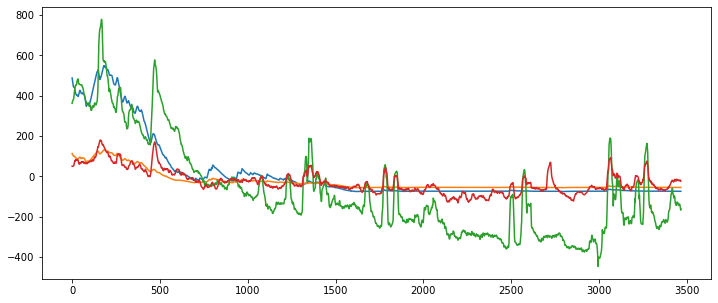

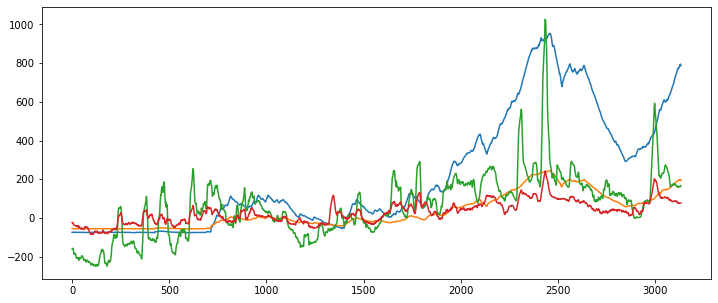

Epoch 56 - Training loss 12748.70736190376 - Test loss 36453.3828125
Epoch 57 - Training loss 12730.597436607432 - Test loss 36306.55078125
Epoch 58 - Training loss 12713.143228233408 - Test loss 36248.1796875
Epoch 59 - Training loss 12692.46435532876 - Test loss 36132.1171875
Epoch 60 - Training loss 12675.796676355765 - Test loss 36027.8125


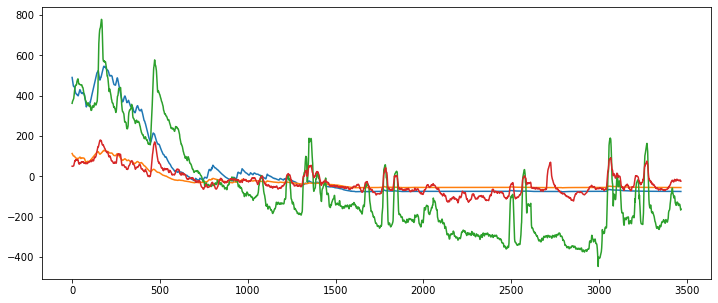

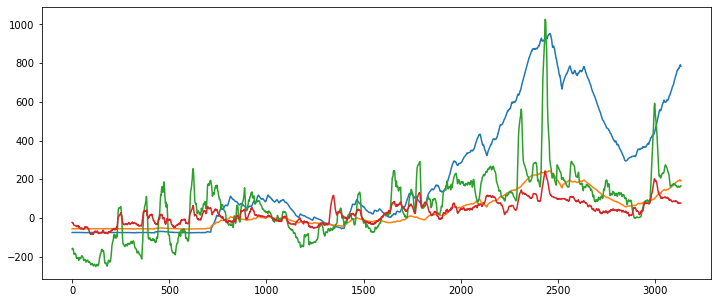

Epoch 61 - Training loss 12657.266600862555 - Test loss 35949.96484375
Epoch 62 - Training loss 12637.464853269244 - Test loss 35843.98828125
Epoch 63 - Training loss 12619.639447973408 - Test loss 35720.484375
Epoch 64 - Training loss 12600.06121938163 - Test loss 35663.046875
Epoch 65 - Training loss 12581.601663711968 - Test loss 35569.39453125


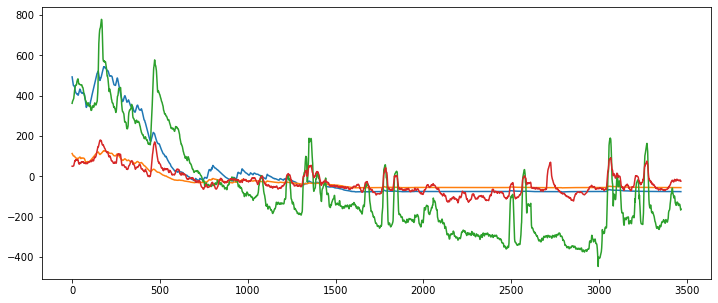

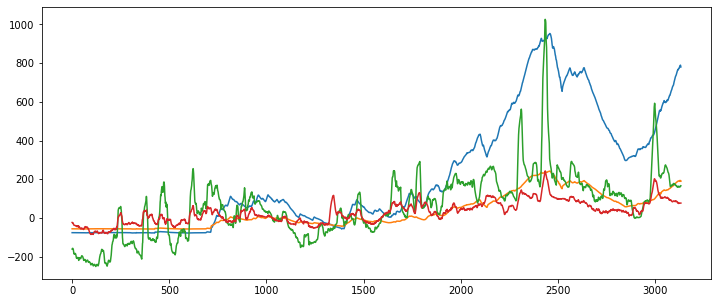

Epoch 66 - Training loss 12564.60590775516 - Test loss 35421.80859375
Epoch 67 - Training loss 12544.596699285945 - Test loss 35381.41015625
Epoch 68 - Training loss 12527.164939110433 - Test loss 35273.22265625
Epoch 69 - Training loss 12507.919810163865 - Test loss 35136.34765625
Epoch 70 - Training loss 12488.54983632499 - Test loss 35082.109375


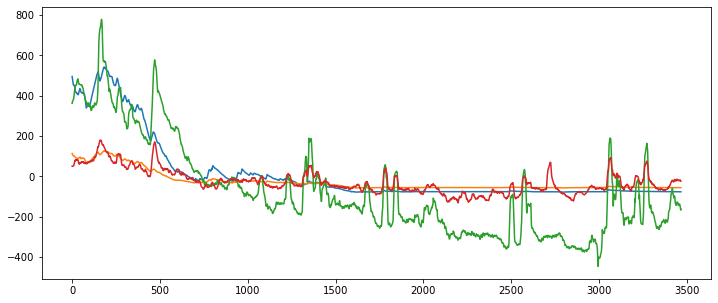

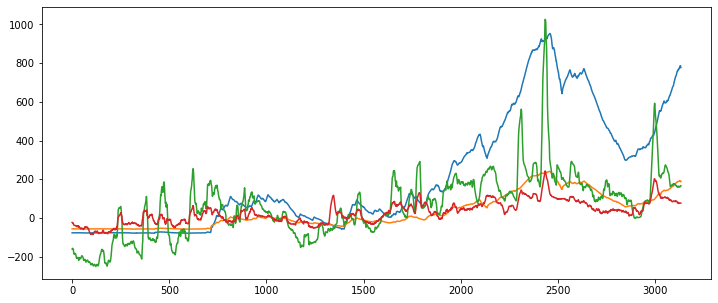

Epoch 71 - Training loss 12471.322793803083 - Test loss 34986.05078125
Epoch 72 - Training loss 12452.069972326995 - Test loss 34872.140625
Epoch 73 - Training loss 12434.09734953434 - Test loss 34833.76953125
Epoch 74 - Training loss 12416.40126121591 - Test loss 34722.8203125
Epoch 75 - Training loss 12396.933361228454 - Test loss 34630.44921875


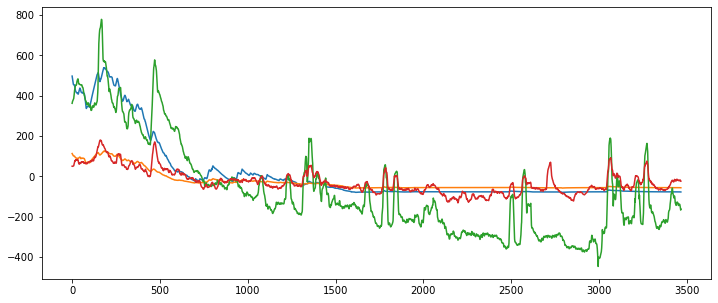

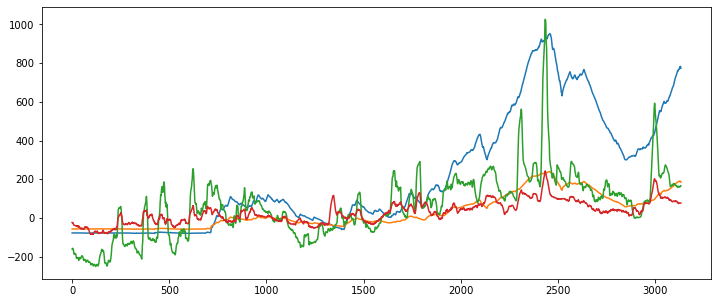

Epoch 76 - Training loss 12378.215177903481 - Test loss 34582.9609375
Epoch 77 - Training loss 12361.524428901323 - Test loss 34482.18359375
Epoch 78 - Training loss 12343.092846091735 - Test loss 34404.6640625
Epoch 79 - Training loss 12325.205300007392 - Test loss 34349.30859375
Epoch 80 - Training loss 12307.490082487055 - Test loss 34252.8203125


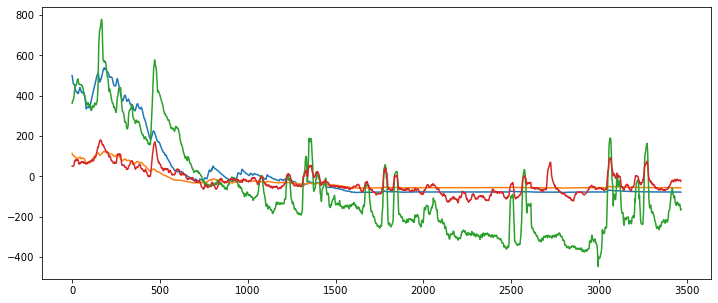

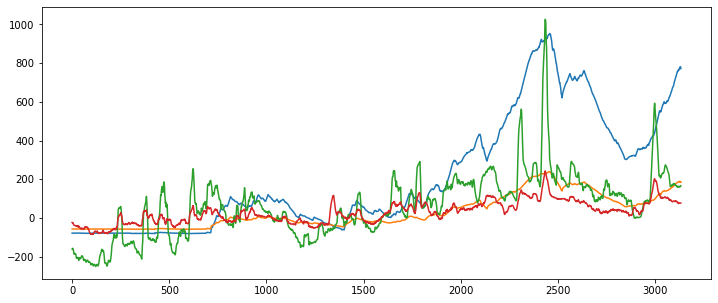

Epoch 81 - Training loss 12290.18372631948 - Test loss 34156.2578125
Epoch 82 - Training loss 12271.364171439354 - Test loss 34121.23828125
Epoch 83 - Training loss 12253.611984952875 - Test loss 34050.6015625
Epoch 84 - Training loss 12237.518149279673 - Test loss 33917.84765625
Epoch 85 - Training loss 12216.906833193718 - Test loss 33878.12890625


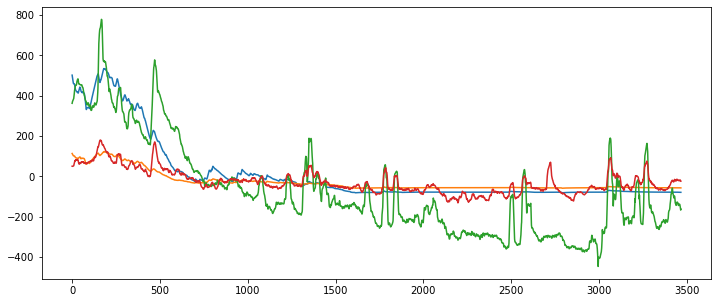

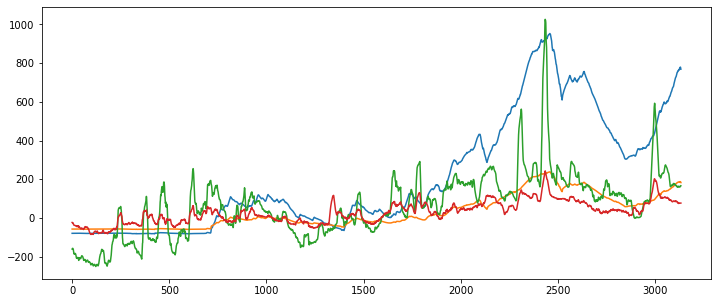

Epoch 86 - Training loss 12198.691775680682 - Test loss 33812.79296875
Epoch 87 - Training loss 12181.313342733121 - Test loss 33719.2734375
Epoch 88 - Training loss 12164.526464899745 - Test loss 33683.79296875
Epoch 89 - Training loss 12144.338800972755 - Test loss 33603.70703125
Epoch 90 - Training loss 12127.708622083752 - Test loss 33576.171875


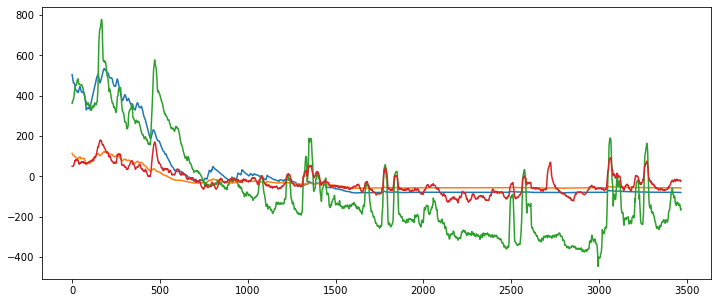

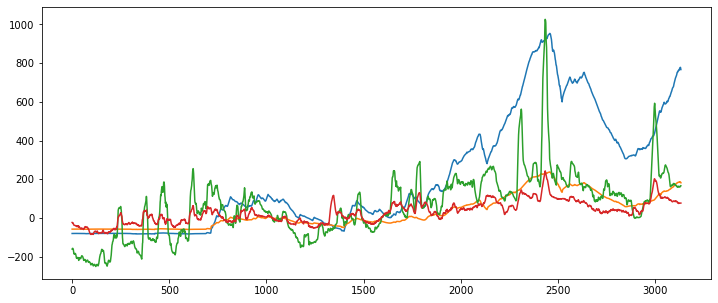

Epoch 91 - Training loss 12112.461524753395 - Test loss 33514.9140625
Epoch 92 - Training loss 12094.736770769872 - Test loss 33417.91015625
Epoch 93 - Training loss 12075.558298793409 - Test loss 33403.4609375
Epoch 94 - Training loss 12058.667036703968 - Test loss 33312.5546875
Epoch 95 - Training loss 12040.025652964181 - Test loss 33206.890625


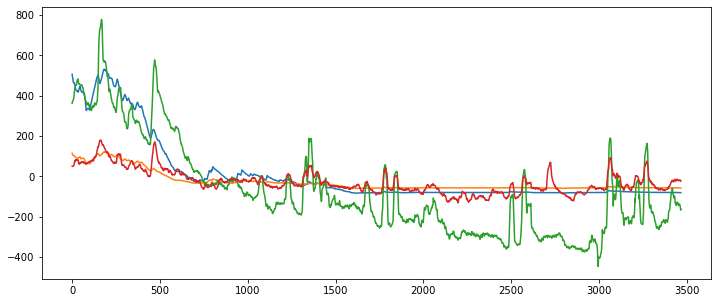

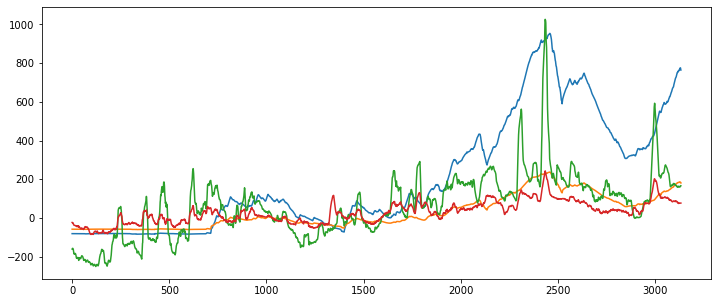

Epoch 96 - Training loss 12021.340969540657 - Test loss 33191.4296875
Epoch 97 - Training loss 12002.892403418864 - Test loss 33121.54296875
Epoch 98 - Training loss 11984.873250418847 - Test loss 33060.05859375
Epoch 99 - Training loss 11967.843659287199 - Test loss 33025.6484375
Epoch 100 - Training loss 11950.138133757706 - Test loss 32966.296875


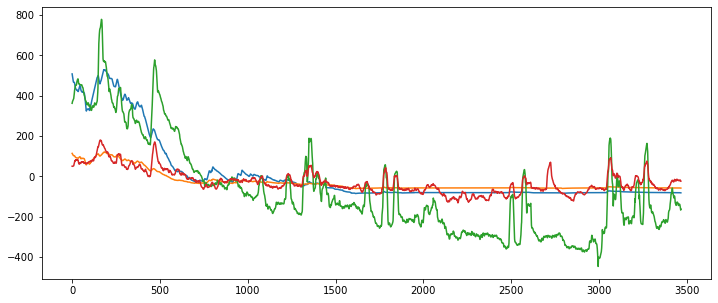

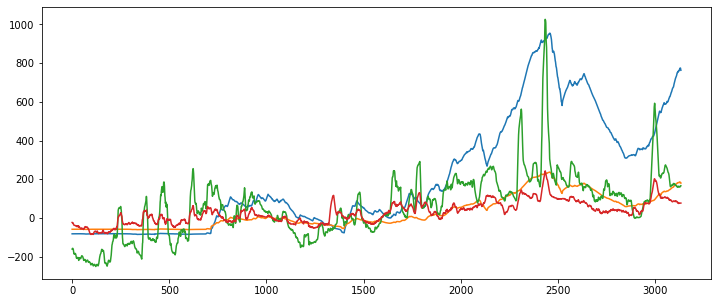

Epoch 101 - Training loss 11931.239172419277 - Test loss 32955.9296875
Epoch 102 - Training loss 11916.24768598364 - Test loss 32891.625
Epoch 103 - Training loss 11898.957413979626 - Test loss 32810.78125
Epoch 104 - Training loss 11882.100949908616 - Test loss 32814.0
Epoch 105 - Training loss 11864.377175707335 - Test loss 32725.951171875


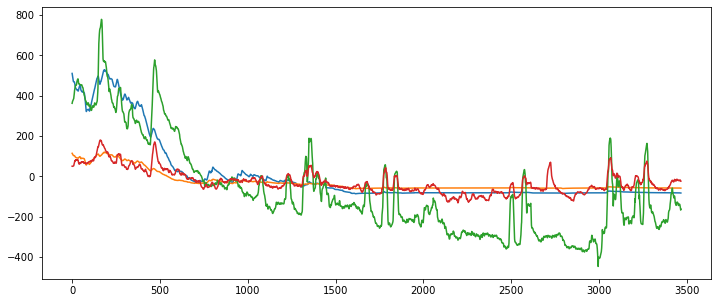

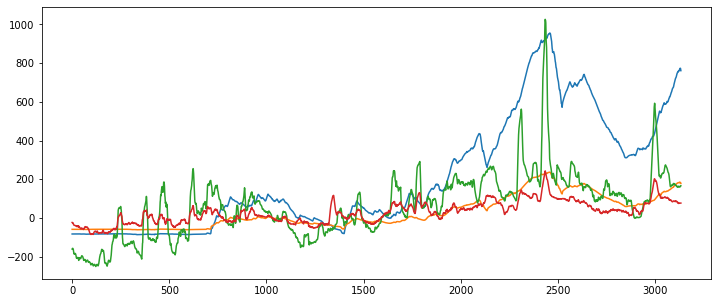

Epoch 106 - Training loss 11843.924363722495 - Test loss 32659.435546875
Epoch 107 - Training loss 11826.536780681085 - Test loss 32645.720703125
Epoch 108 - Training loss 11809.10623084952 - Test loss 32585.990234375
Epoch 109 - Training loss 11793.649532213123 - Test loss 32511.708984375


In [26]:


# Start training cycle
global_step = 1

n_samples = len(training_data_loader.dataset)
n_steps = np.ceil(n_samples / training_data_loader.batch_size).astype(np.int32)

learning_rates = {#1:5e-2,
                  10: 2e-3,
                  20: 1e-3,
                  30: 5e-4,
                  35: 1e-4}

for epoch in range(1, 1000):
    if epoch in learning_rates.keys():
        for param_group in optimizer.param_groups:
            param_group["lr"] = learning_rates[epoch]
            
    # Train routine for a single epoch
    model.train()
    epoc_losses = []
    trues = []
    for i, (x, y) in enumerate(training_data_loader):
        x, y = x.permute((1,0,2)).to(DEVICE), y.to(DEVICE)
        
        optimizer.zero_grad()
        predictions, *_ = model(x)
        
        loss = loss_func(predictions.squeeze(), y.squeeze())
        # calculate gradients
        loss.backward()
        # perform parameter update
        optimizer.step()
        # lr_scheduler.step()

        # if (i + 1) % 1 == 0:
        # print(loss.item(),end='\r')
        epoc_losses.append(loss.item())
        
    model.eval()
    preds, obs = None, None
    with torch.no_grad():
        for i, (x, y) in enumerate(validation_data_loader):
            x, y = x.permute((1,0,2)).to(DEVICE), y.to(DEVICE)
            val_pred,*_ = model(x)
            val_loss = loss_func(val_pred.squeeze(),y)
            # train_error = loss = loss_func(predictions.squeeze(), y)
            print(f"Epoch {epoch} - Training loss {np.mean(epoc_losses)} - Test loss {np.mean(val_loss.item())}")

                # if cfg["tensorboard"]:
                #     writer.add_scalar('train/loss', loss.item(), global_step)

        if (global_step % 5) == 0:
            y_train_pred,*_= model(X_train.permute((1,0,2)))
            plt.figure(figsize=(12,5))
            plt.plot(y_train_pred.squeeze().cpu().detach().numpy())
            plt.plot(y_train.cpu().detach().numpy())
            plt.show()
            
            y_val_pred,*_= model(X_val.permute((1,0,2)))
            plt.figure(figsize=(12,5))
            plt.plot(y_val_pred.squeeze().cpu().detach().numpy())
            plt.plot(y_val.cpu().detach().numpy())
            plt.show()
            
            
        
    # Evaluation routine on validation set
    if (global_step % 100) == 0:
    
        weight_file =  f'model_state/model_epoch{epoch}.pt'
        torch.save(model.state_dict(), str(weight_file))
        
    global_step += 1

In [ ]:
# np.any(np.isnan(inputs))  

In [ ]:
output = model(X_train)

In [ ]:
X_train.permute()

In [ ]:
[i.shape for i in output]